# PIXEL-WISE-SUPERVISION-SIAMESE-NETWORK W/ PYRAMID SUPERVISION

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
cd /content/drive/MyDrive/BTP/pixel-wise-supervision-siamese-network

/content/drive/MyDrive/BTP/pixel-wise-supervision-siamese-network


In [3]:
import os
import cv2
import zipfile
import random
import numpy as np
from tqdm import tqdm
import tensorflow as tf
from datetime import datetime
from sklearn.utils import shuffle
from tensorflow import keras
import shutil
import dlib
from imutils import face_utils
from google.colab.patches import cv2_imshow
from tensorflow.keras.applications.resnet50 import ResNet50

%load_ext tensorboard

In [4]:
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
    raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [22]:
epochs = 50

optimizer = tf.keras.optimizers.Adam(learning_rate=0.00006)
binary_cross_entropy = tf.keras.losses.BinaryCrossentropy()

# base_dir = "."
base_dir = "/content/drive/MyDrive/BTP/pixel-wise-supervision-siamese-network/pyramid-supervision"

stamp = datetime.now().strftime("%Y%m%d-%H%M%S")
logdir = os.path.join(base_dir, 'logs/func/%s' % stamp)
writer = tf.summary.create_file_writer(logdir)

scalar_logdir = os.path.join(base_dir, 'logs/scalars/%s' % stamp)
file_writer = tf.summary.create_file_writer(scalar_logdir + "/metrics")

checkpoint_path = os.path.join(base_dir, 'logs/model/pixel-wise-supervision-siamese-pyramid-supervision-1-1')

In [6]:
'''
The following code cell is taken from the source code of keras_vggface.
I tried using the preprocess_input function provided by tf.keras but they provide different results.
To my knowledge, it seems that the mean values which are subtracted in each image are different.
'''
K = tf.keras.backend

def preprocess_input(x, data_format=None, version=1):
    x_temp = np.copy(x)
    if data_format is None:
        data_format = K.image_data_format()
    assert data_format in {'channels_last', 'channels_first'}

    if version == 1:
        if data_format == 'channels_first':
            x_temp = x_temp[:, ::-1, ...]
            x_temp[:, 0, :, :] -= 93.5940
            x_temp[:, 1, :, :] -= 104.7624
            x_temp[:, 2, :, :] -= 129.1863
        else:
            x_temp = x_temp[..., ::-1]
            x_temp[..., 0] -= 93.5940
            x_temp[..., 1] -= 104.7624
            x_temp[..., 2] -= 129.1863

    elif version == 2:
        if data_format == 'channels_first':
            x_temp = x_temp[:, ::-1, ...]
            x_temp[:, 0, :, :] -= 91.4953
            x_temp[:, 1, :, :] -= 103.8827
            x_temp[:, 2, :, :] -= 131.0912
        else:
            x_temp = x_temp[..., ::-1]
            x_temp[..., 0] -= 91.4953
            x_temp[..., 1] -= 103.8827
            x_temp[..., 2] -= 131.0912
    else:
        raise NotImplementedError

    return x_temp

In [ ]:
# def curate_dataset(dataset_path):
#         with open(os.path.join(dataset_path, 'list.txt'), 'r') as f:
#             dataset = {}
#             image_list = f.read().split()
#             print('Total images: ',len(image_list))
#             for image in image_list:
#                 folder_name, class_type ,file_name = image.split('/')
#                 if folder_name in dataset.keys():
#                   if class_type in dataset[folder_name].keys():
#                     dataset[folder_name][class_type].append(file_name)
#                   else:
#                     dataset[folder_name][class_type] = [file_name]
#                 else:
#                     dataset[folder_name] = {class_type: [file_name]}
#         return dataset

# dataset = curate_dataset('./dataset/train')
# print(dataset.keys()) 
# print(len(dataset['client016']['spoof']))
# print(len(dataset['client016']['real']))

Total images:  91705
dict_keys(['client016', 'client025', 'client108', 'client006', 'client027', 'client103', 'client004', 'client008', 'client018', 'client007', 'client012', 'client110', 'client002', 'client001', 'client105'])
4538
1500


In [7]:
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, dataset_path, batch_size=32, shuffle=True):
        self.dataset = self.curate_dataset(dataset_path)
        self.dataset_path = dataset_path
        self.shuffle = shuffle
        self.batch_size =batch_size
        self.no_of_people = len(list(self.dataset.keys()))
        self.on_epoch_end()
        
    def __getitem__(self, index):
        people = list(self.dataset.keys())[index * self.batch_size: (index + 1) * self.batch_size]
        P = []
        A = []
        N = []
        
        for person in people:
            anchor_index = random.randint(0, len(self.dataset[person]['real'])-1)
            a = self.get_image(person, 'real' ,anchor_index)
            
            positive_index = random.randint(0, len(self.dataset[person]['real'])-1)
            while positive_index == anchor_index:
                positive_index = random.randint(0, len(self.dataset[person]['real'])-1)
            p = self.get_image(person, 'real' ,positive_index)
            
            negative_index = random.randint(0, len(self.dataset[person]['spoof'])-1)
            n = self.get_image(person, 'spoof',negative_index)
            
            P.append(p)
            A.append(a)
            N.append(n)
            
        A = np.asarray(A)
        N = np.asarray(N)
        P = np.asarray(P)
        return [A, P, N]
        
    def __len__(self):
        return self.no_of_people // self.batch_size
        
    def curate_dataset(self,dataset_path):
        with open(os.path.join(dataset_path, 'list.txt'), 'r') as f:
            dataset = {}
            image_list = f.read().split()
            print('Total images: ',len(image_list))
            for image in image_list:
                folder_name, class_type ,file_name = image.split('/')
                if folder_name in dataset.keys():
                  if class_type in dataset[folder_name].keys():
                    dataset[folder_name][class_type].append(file_name)
                  else:
                    dataset[folder_name][class_type] = [file_name]
                else:
                    dataset[folder_name] = {class_type: [file_name]}
        return dataset
    
    def on_epoch_end(self):
        if self.shuffle:
            keys = list(self.dataset.keys())
            random.shuffle(keys)
            dataset_ =  {}
            for key in keys:
                dataset_[key] = self.dataset[key]
            self.dataset = dataset_
            
    def get_image(self, person, class_type, index):
        # print(os.path.join(self.dataset_path, os.path.join('images/' + person+f'/{class_type}', self.dataset[person][class_type][index])))
        img = cv2.imread(os.path.join(self.dataset_path, os.path.join('images/' + person+f'/{class_type}', self.dataset[person][class_type][index])))
        img = cv2.resize(img, (256, 256))
        img = np.asarray(img, dtype=np.float64)
        img = preprocess_input(img)
        return img

In [ ]:
# index = 4
# cv2.imshow("Positive", p[index])
# cv2.imshow("Negative", n[index])
# cv2.imshow("Anchor", a[index])
# cv2.waitKey(0)
# cv2.destroyAllWindows()

In [8]:
vggface = tf.keras.models.Sequential()
vggface.add(tf.keras.layers.Convolution2D(64, (3, 3), activation='relu', padding="SAME", input_shape=(256,256, 3)))
vggface.add(tf.keras.layers.Convolution2D(64, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.MaxPooling2D((2,2), strides=(2,2)))
 
vggface.add(tf.keras.layers.Convolution2D(128, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(128, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.MaxPooling2D((2,2), strides=(2,2)))
 
vggface.add(tf.keras.layers.Convolution2D(256, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(256, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(256, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.MaxPooling2D((2,2), strides=(2,2)))
 
vggface.add(tf.keras.layers.Convolution2D(512, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(512, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(512, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.MaxPooling2D((2,2), strides=(2,2)))
 
vggface.add(tf.keras.layers.Convolution2D(512, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(512, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(512, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.MaxPooling2D((2,2), strides=(2,2)))

vggface.add(tf.keras.layers.Flatten())

vggface.add(tf.keras.layers.Dense(4096, activation='relu'))
vggface.add(tf.keras.layers.Dropout(0.5))
vggface.add(tf.keras.layers.Dense(4096, activation='relu'))
vggface.add(tf.keras.layers.Dropout(0.5))
vggface.add(tf.keras.layers.Dense(2622, activation='softmax'))

In [ ]:
vggface.load_weights(os.path.join(base_dir, 'vgg_face_weights.h5'))

In [9]:
vggface.pop()
vggface.add(tf.keras.layers.Dense(128, use_bias=False,activation='sigmoid'))

for layer in vggface.layers[:-2]:
    layer.trainable = False

In [10]:
class SiameseNetwork(tf.keras.Model):
    def __init__(self, vgg_face):
        super(SiameseNetwork, self).__init__()
        self.vgg_face = vgg_face
        
    @tf.function
    def call(self, inputs):
        image_1, image_2, image_3 =  inputs
        with tf.name_scope("Anchor") as scope:
            feature_1 = self.vgg_face(image_1)
            feature_1 = tf.math.l2_normalize(feature_1, axis=-1)
        with tf.name_scope("Positive") as scope:
            feature_2 = self.vgg_face(image_2)
            feature_2 = tf.math.l2_normalize(feature_2, axis=-1)
        with tf.name_scope("Negative") as scope:
            feature_3 = self.vgg_face(image_3)
            feature_3 = tf.math.l2_normalize(feature_3, axis=-1)
        return [feature_1, feature_2, feature_3]
    
    @tf.function
    def get_features(self, inputs):
        return tf.math.l2_normalize(self.vgg_face(inputs), axis=-1)

In [ ]:
# IMG_SHAPE = (256, 256, 3)

In [ ]:
# class SiameseNetwork(tf.keras.Model):
#     def __init__(self,name="siamese_resnet50", **kwargs):
#         super(SiameseNetwork, self).__init__()
#         self.backbone = ResNet50(input_shape=IMG_SHAPE, include_top=False, weights='imagenet')
#         # avg. pooling
#         self.avgpool_8 = tf.keras.layers.AveragePooling2D(pool_size=(1,1), strides=1, padding='valid', data_format=None)
#         self.avgpool_4= tf.keras.layers.AveragePooling2D(pool_size=(2,2), strides=2, padding='valid', data_format=None)
#         self.avgpool_2= tf.keras.layers.AveragePooling2D(pool_size=(4,4), strides=4, padding='valid', data_format=None)
#         self.avgpool_1= tf.keras.layers.AveragePooling2D(pool_size=(8,8), strides=8, padding='valid', data_format=None)
#         # 1x1 conv
#         self.theta_8 = tf.keras.layers.Conv2D(1, (1,1), activation='sigmoid')
#         self.theta_4 = tf.keras.layers.Conv2D(1, (1,1), activation='sigmoid')
#         self.theta_2 = tf.keras.layers.Conv2D(1, (1,1), activation='sigmoid')
#         self.theta_1 = tf.keras.layers.Conv2D(1, (1,1), activation='sigmoid')
#         # dense layer
#         self.fc = tf.keras.layers.Dense(1, use_bias=True)
#         # loss
#         # self.loss_object = tf.keras.losses.BinaryCrossentropy()
    
#     def compile(self, input_img):
#         F = self.backbone(input_img)
#         # M8
#         x = self.avgpool_8(F)
#         M8 = self.theta_8(x)
#         # M4
#         x = self.avgpool_4(F)
#         M4 = self.theta_4(x)
#         # M2
#         x = self.avgpool_2(F)
#         M2 = self.theta_2(x)
#         # M1
#         x = self.avgpool_1(F)
#         M1 = self.theta_1(x)
#         # concatenate and predict
#         x = tf.keras.layers.Concatenate(axis=1)([tf.keras.layers.Flatten()(M8), tf.keras.layers.Flatten()(M4), tf.keras.layers.Flatten()(M2), tf.keras.layers.Flatten()(M1)])
#         y_pred = self.fc(x)
#         # pyramid loss

#         # pyramid_loss = tf.reduce_mean([self.loss_object(label_8, M8), self.loss_object(label_4, M4), self.loss_object(label_2, M2), self.loss_object(label_1, M1)])
#         # self.add_loss(pyramid_loss)

#         return y_pred
        
#     @tf.function
#     def call(self, inputs):
#         image_1, image_2, image_3 =  inputs
#         with tf.name_scope("Anchor") as scope:
#             # feature_1 = self.vgg_face(image_1)
#             feature_1 = self.compile(image_1)
#             feature_1 = tf.math.l2_normalize(feature_1, axis=-1)
#         with tf.name_scope("Positive") as scope:
#             # feature_2 = self.vgg_face(image_2)
#             feature_2 = self.compile(image_2)
#             feature_2 = tf.math.l2_normalize(feature_2, axis=-1)
#         with tf.name_scope("Negative") as scope:
#             # feature_3 = self.vgg_face(image_3)
#             feature_3 = self.compile(image_3)
#             feature_3 = tf.math.l2_normalize(feature_3, axis=-1)
#         return [feature_1, feature_2, feature_3]
    
#     @tf.function
#     def get_features(self, inputs):
#         return tf.math.l2_normalize(self.compile(inputs), axis=-1)

In [12]:
model = SiameseNetwork(vggface)

In [ ]:
def loss_function(x, alpha = 0.2):
    # Triplet Loss function.
    anchor,positive,negative = x
    # distance between the anchor and the positive
    pos_dist = K.sum(K.square(anchor-positive),axis=1)
    # distance between the anchor and the negative
    neg_dist = K.sum(K.square(anchor-negative),axis=1)
    # compute loss
    basic_loss = pos_dist-neg_dist+alpha
    loss = K.mean(K.maximum(basic_loss,0.0))
    return loss

In [31]:
def lossless_triplet_loss(y_true, y_pred, N = 3, beta=3, epsilon=1e-8):
    """
    Implementation of the triplet loss function
    
    Arguments:
    y_true -- true labels, required when you define a loss in Keras, you don't need it in this function.
    y_pred -- python list containing three objects:
            anchor -- the encodings for the anchor data
            positive -- the encodings for the positive data (similar to anchor)
            negative -- the encodings for the negative data (different from anchor)
    N  --  The number of dimension 
    beta -- The scaling factor, N is recommended
    epsilon -- The Epsilon value to prevent ln(0)
    
    
    Returns:
    loss -- real number, value of the loss
    """
    # anchor = tf.convert_to_tensor(y_pred[:,0:N])
    # positive = tf.convert_to_tensor(y_pred[:,N:N*2]) 
    # negative = tf.convert_to_tensor(y_pred[:,N*2:N*3])

    anchor,positive,negative = y_pred
    
    # distance between the anchor and the positive
    pos_dist = tf.reduce_sum(tf.square(tf.subtract(anchor,positive)),1)
    # distance between the anchor and the negative
    neg_dist = tf.reduce_sum(tf.square(tf.subtract(anchor,negative)),1)
    
    #Non Linear Values  
    
    # -ln(-x/N+1)
    pos_dist = -tf.math.log(-tf.divide((pos_dist),beta)+1+epsilon)
    neg_dist = -tf.math.log(-tf.divide((N-neg_dist),beta)+1+epsilon)
    
    # compute loss
    loss = neg_dist + pos_dist
    
    return loss

In [32]:
def train(X):
    with tf.GradientTape() as tape:
        y_pred = model(X)
        loss = lossless_triplet_loss(None,y_pred)
    grad = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grad, model.trainable_variables))
    return loss

In [35]:
tf.summary.trace_on(graph=True, profiler=False)
output = model([tf.zeros((32,256,256,3)), tf.zeros((32,256,256,3)), tf.zeros((32,256,256,3))])
with writer.as_default():
    tf.summary.trace_export(name="my_func_trace", step=0, profiler_outdir=logdir)
    
tf.summary.trace_off()

In [17]:
data_generator = DataGenerator(dataset_path='./dataset/train', batch_size=1)

Total images:  91705


In [18]:
data_generator.get_image('client001','real',0)

array([[[  28.406 ,   26.2376,  -10.1863],
        [  28.406 ,   26.2376,   -9.1863],
        [  27.406 ,   26.2376,   -6.1863],
        ...,
        [ -88.594 , -101.7624, -124.1863],
        [ -85.594 , -104.7624, -127.1863],
        [ -84.594 , -104.7624, -128.1863]],

       [[  29.406 ,   27.2376,  -10.1863],
        [  29.406 ,   27.2376,   -9.1863],
        [  28.406 ,   27.2376,   -6.1863],
        ...,
        [ -88.594 , -100.7624, -124.1863],
        [ -85.594 , -103.7624, -127.1863],
        [ -84.594 , -104.7624, -128.1863]],

       [[  32.406 ,   31.2376,  -11.1863],
        [  32.406 ,   31.2376,  -10.1863],
        [  32.406 ,   31.2376,   -6.1863],
        ...,
        [ -87.594 ,  -99.7624, -121.1863],
        [ -86.594 , -102.7624, -126.1863],
        [ -86.594 , -103.7624, -128.1863]],

       ...,

       [[  27.406 ,   -5.7624,  -28.1863],
        [  27.406 ,   -5.7624,  -28.1863],
        [  27.406 ,   -5.7624,  -29.1863],
        ...,
        [ -92.594 , -104.7

In [ ]:
# data_curated = data_generator.curate_dataset(dataset_path='./dataset/train')
# print(len(data_curated['n000009']))

In [19]:
print(data_generator[14])

[array([[[[  3.406 ,  12.2376,  -2.1863],
         [  0.406 ,   9.2376,  -5.1863],
         [-10.594 ,  -1.7624, -15.1863],
         ...,
         [ 84.406 ,  62.2376,  19.8137],
         [ 84.406 ,  62.2376,  19.8137],
         [ 84.406 ,  62.2376,  19.8137]],

        [[  5.406 ,  13.2376,  -1.1863],
         [  3.406 ,  10.2376,  -4.1863],
         [ -8.594 ,  -0.7624, -15.1863],
         ...,
         [ 84.406 ,  62.2376,  19.8137],
         [ 84.406 ,  62.2376,  19.8137],
         [ 84.406 ,  62.2376,  19.8137]],

        [[ 15.406 ,  17.2376,   2.8137],
         [ 12.406 ,  14.2376,  -0.1863],
         [  0.406 ,   2.2376, -11.1863],
         ...,
         [ 83.406 ,  61.2376,  18.8137],
         [ 83.406 ,  61.2376,  18.8137],
         [ 83.406 ,  61.2376,  18.8137]],

        ...,

        [[ 52.406 ,  35.2376,  25.8137],
         [ 53.406 ,  35.2376,  25.8137],
         [ 55.406 ,  37.2376,  27.8137],
         ...,
         [-35.594 , -56.7624, -93.1863],
         [-36.594 , -

In [20]:
a, p, n = data_generator[0]

In [ ]:
# index = 1
# cv2.imshow("Positive", p[index])
# cv2.imshow("Negative", n[index])
# cv2.imshow("Anchor", a[index])
# cv2.waitKey(0)
# cv2.destroyAllWindows()

In [23]:
%tensorboard --logdir /content/drive/My\ Drive/pixel-wise-supervision-siamese-network/pyramid-supervision/logs/
# %tensorboard --logdir ./logs/

<IPython.core.display.Javascript object>

In [33]:
checkpoint = tf.train.Checkpoint(model=model)

In [38]:
losses = []
accuracy = []

no_of_batches = data_generator.__len__()
for i in range(1, epochs+1, 1):
    loss = 0
    with tqdm(total=no_of_batches) as pbar:
        
        description = "Epoch " + str(i) + "/" + str(epochs)
        pbar.set_description_str(description)
        
        for j in range(no_of_batches):
            data = data_generator[j]
            temp = train(data)
            loss += temp
            
            pbar.update()
            print_statement = "Loss :" + str(temp.numpy()[0])
            pbar.set_postfix_str(print_statement)
        
        loss /= no_of_batches
        losses.append(loss.numpy())
        with file_writer.as_default():
            tf.summary.scalar('Loss', data=loss.numpy()[0], step=i)
            
        print_statement = "Loss :" + str(loss.numpy()[0])
        
        pbar.set_postfix_str(print_statement)

checkpoint.save(checkpoint_path)
print("Checkpoint Saved")

Epoch 50/50: 100%|██████████| 15/15 [00:42<00:00,  2.81s/it, Loss :5.1319947]


Checkpoint Saved


### PREDICTION

In [ ]:
if os.path.isdir('dataset/test'):
  # shutil.rmtree('dataset/test')
  pass
else:
  # !unzip dataset/images.zip -d dataset/
  with zipfile.ZipFile('dataset/test.zip', 'r') as zip_ref:
    zip_ref.extractall('dataset/')


In [ ]:
test_data_multiple_dir = './dataset/test/images/multiple/' 
features = []

In [ ]:
people = sorted(os.listdir(test_data_multiple_dir))
face_detector = dlib.get_frontal_face_detector()
features = []
dumpable_features = {}

In [ ]:
model = SiameseNetwork()
checkpoint = tf.train.Checkpoint(model=model)
checkpoint.restore(checkpoint_path)

In [ ]:
for person in people:
    person_path = os.path.join(test_data_multiple_dir, person)
    print(person_path)
    images = []
    for image in os.listdir(person_path):
        image_path = os.path.join(person_path, image)
        img = cv2.imread(image_path)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        faces = face_detector(gray, 0)
        if len(faces) == 1:
            for face in faces:
                face_bounding_box = face_utils.rect_to_bb(face)
                if all(i >= 0 for i in face_bounding_box):
                    [x, y, w, h] = face_bounding_box
                    frame = img[y:y + h, x:x + w]
                    frame = cv2.resize(frame, (256, 256))
                    frame = np.asarray(frame, dtype=np.float64)
                    images.append(frame)
    images = np.asarray(images)
    images = preprocess_input(images)
    images = tf.convert_to_tensor(images)
    feature = model.get_features(images)
    feature = tf.reduce_mean(feature, axis=0)
    features.append(feature.numpy())
    dumpable_features[person] = feature.numpy()

./dataset/test/images/multiple/client_009
./dataset/test/images/multiple/client_011
./dataset/test/images/multiple/client_019
./dataset/test/images/multiple/client_102
./dataset/test/images/multiple/client_117


In [ ]:
features = np.asarray(features)

In [ ]:
print(people)

['client_009', 'client_011', 'client_019', 'client_102', 'client_117']


In [ ]:
def is_image_recognized(path):
  name = 'SPOOF'
  img = cv2.imread(path)
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  faces = face_detector(gray, 0)
  for face in faces:
      face_bounding_box = face_utils.rect_to_bb(face)
      if all(i >= 0 for i in face_bounding_box):
          [x, y, w, h] = face_bounding_box
          frame = img[y:y + h, x:x + w]
          cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
          frame = cv2.resize(frame, (256, 256))
          frame = np.asarray(frame, dtype=np.float64)
          frame = np.expand_dims(frame, axis=0)
          frame = preprocess_input(frame)
          feature = model.get_features(frame)
              
          dist = tf.norm(features - feature, axis=1)
          name = 'SPOOF'
          loc = tf.argmin(dist)
          if dist[loc] < 0.3:
              name = f'{people[loc]}-REAL--{dist[loc]}'
          else:
              # print(dist.numpy())
              name = f'{people[loc]}-SPOOF--{dist[loc]}'
                  
          font_face = cv2.FONT_HERSHEY_SIMPLEX
          cv2.putText(img, name, (x, y-5), font_face, 0.8, (0,0,255), 3)
  cv2_imshow(img)
  return True

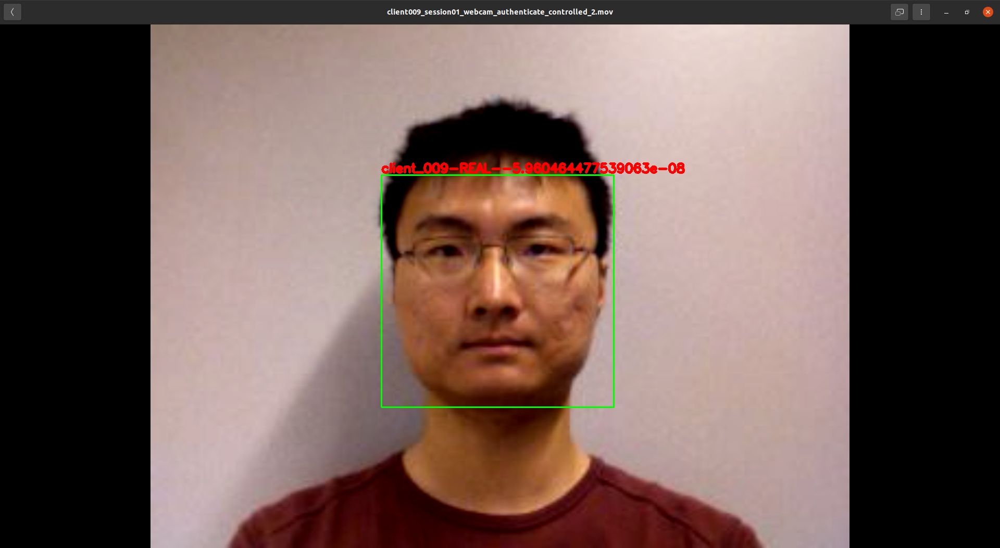

True


In [ ]:
is_rec = is_image_recognized('./dataset/test/images/single/client_009_real.png')
print(is_rec)

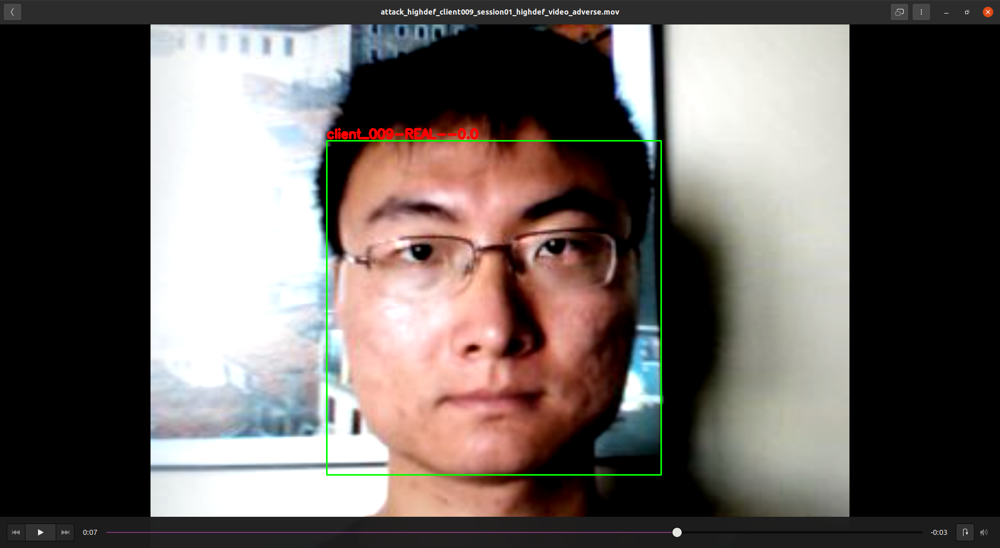

True


In [ ]:
is_rec = is_image_recognized('./dataset/test/images/single/client_009_spoof.png')
print(is_rec)

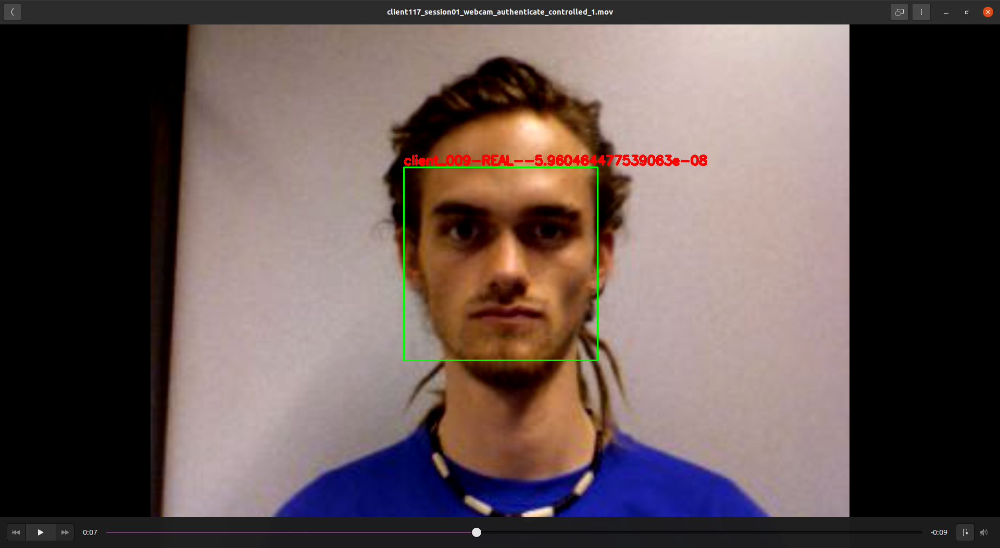

True


In [ ]:
is_rec = is_image_recognized('./dataset/test/images/single/client_117_real.png')
print(is_rec)

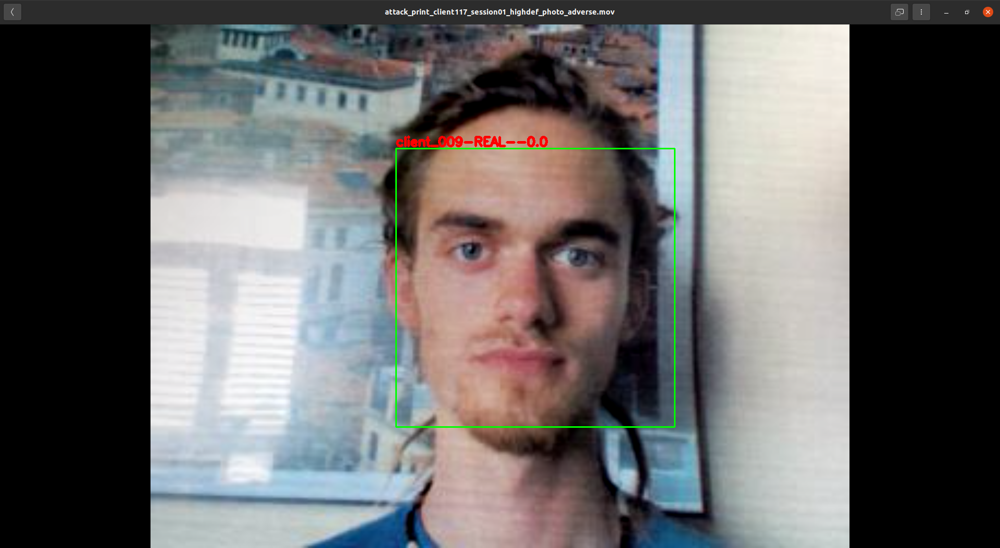

True


In [ ]:
is_rec = is_image_recognized('./dataset/test/images/single/client_117_spoof.png')
print(is_rec)

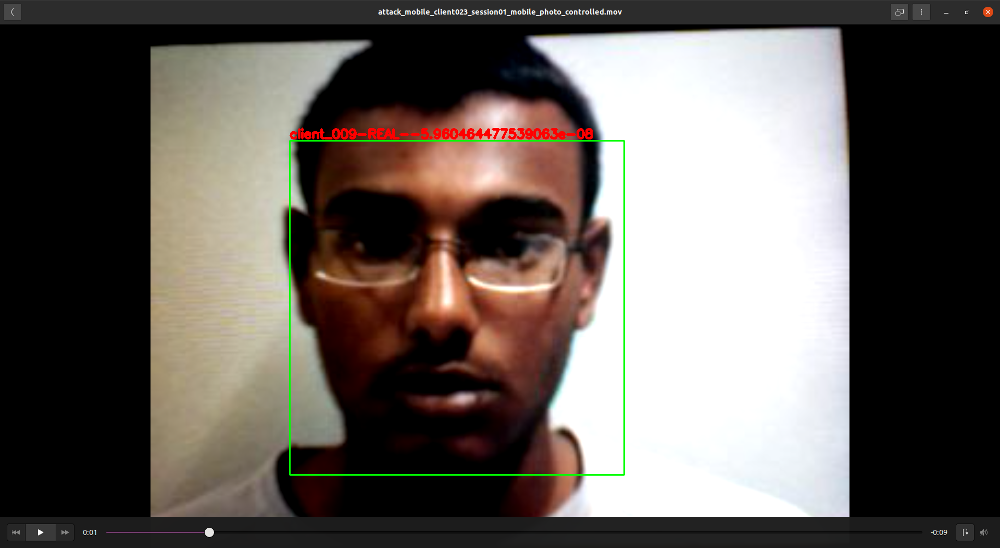

True


In [ ]:
is_rec = is_image_recognized('./dataset/test/images/single/client_023_404_attack.png')
print(is_rec)

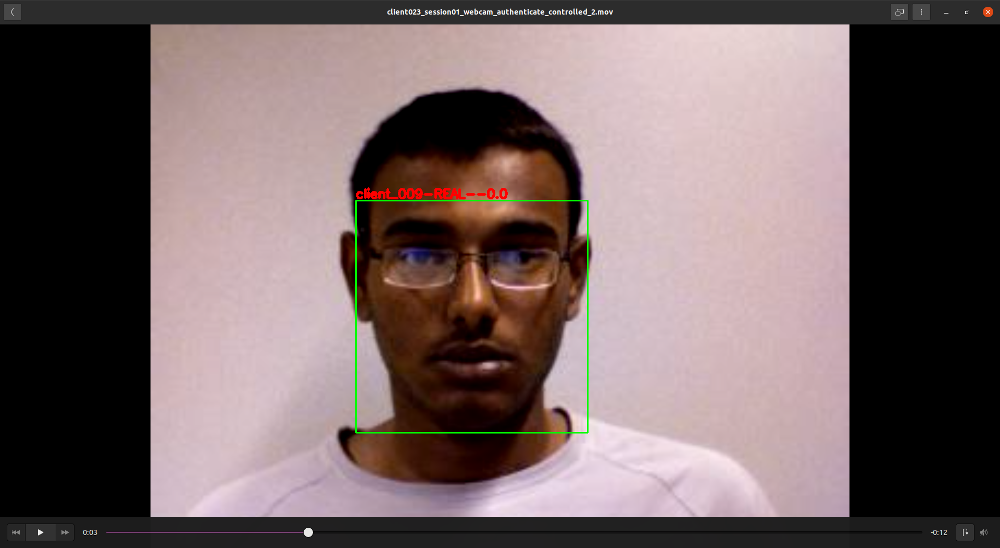

True


In [ ]:
is_rec = is_image_recognized('./dataset/test/images/single/client_023_404_real.png')
print(is_rec)